<a href="https://colab.research.google.com/github/vposwalia/Recommendation-System-In-Spotify-by-Machine-Learning/blob/main/spotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [71]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

In [72]:
data = pd.read_csv("/data.csv")
genre_data = pd.read_csv('/data_by_genres.csv')
year_data = pd.read_csv('/data_by_year.csv')

In [73]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [74]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [75]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


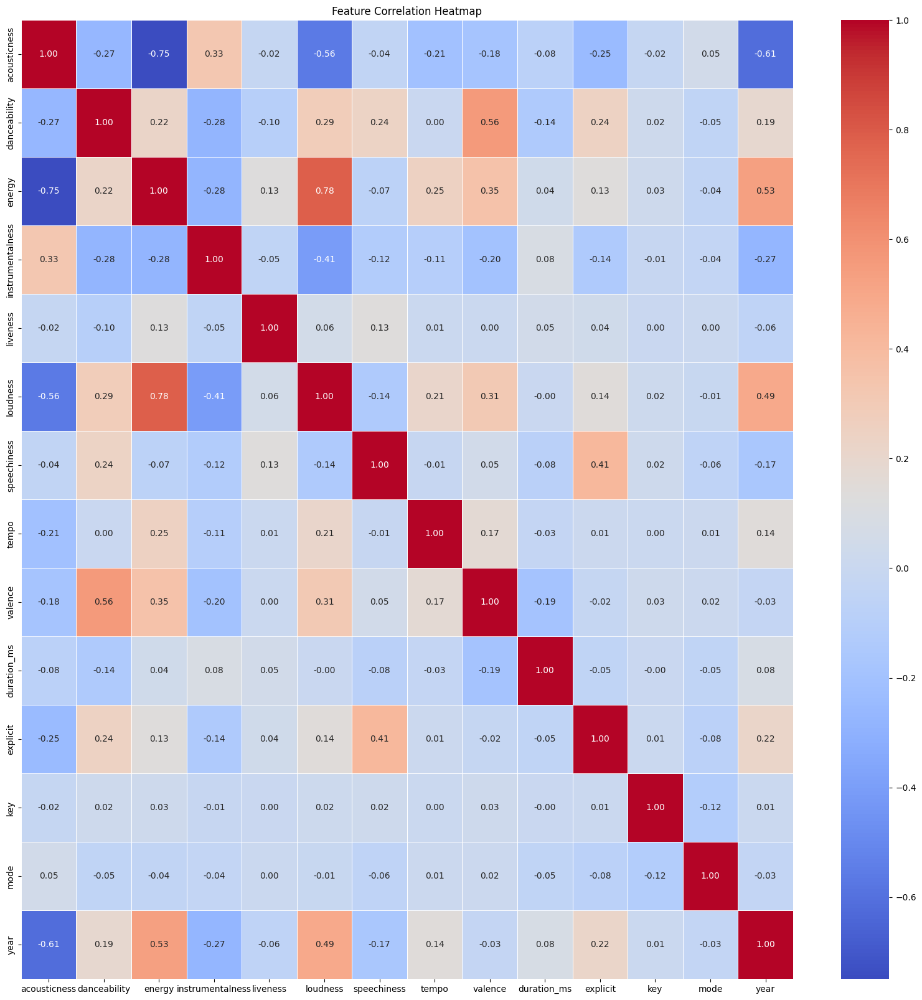

In [76]:
#we are using heatmap to visualize correlations.
#using seaborn and matplot
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                 'liveness', 'loudness', 'speechiness', 'tempo', 'valence',
                 'duration_ms', 'explicit', 'key', 'mode', 'year']

X, y = data[feature_names], data['popularity']

# Calculate the correlation matrix
correlation_matrix = X.corr()

# Plot the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.show()


In [77]:
#Understanding by visualization
#we are creating a new decade column and then visualizing the count of songs per decade using Seaborn countplot

<ipython-input-78-036469d72d59>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




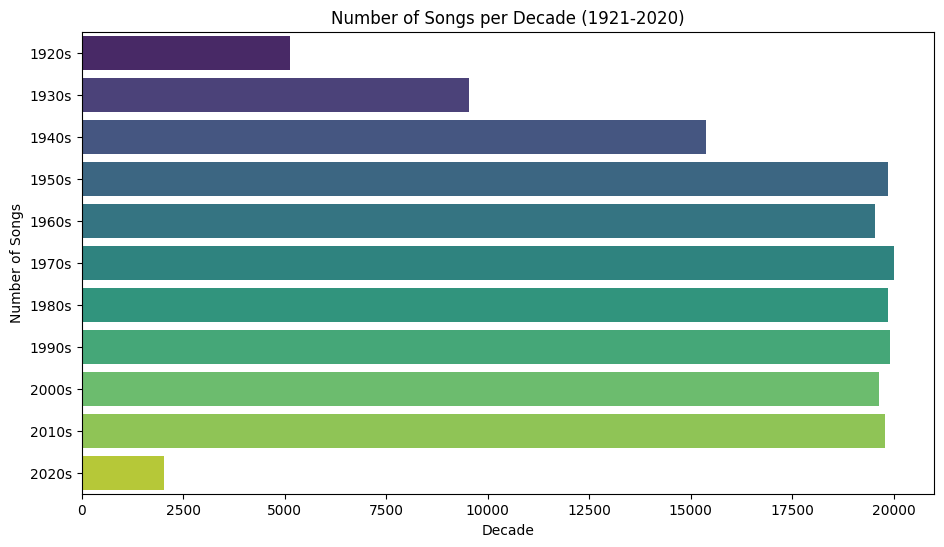

In [78]:
# Function to get the decade from the year
def get_decade(year):
    return f"{int(year/10) * 10}s"

# Apply the function to create a new 'decade' column
data['decade'] = data['year'].apply(get_decade)

# Set the figure size
plt.figure(figsize=(11, 6))

# Plot the count of songs per decade
sns.countplot(data['decade'], palette='viridis')

plt.xlabel('Decade')
plt.ylabel('Number of Songs')
plt.title('Number of Songs per Decade (1921-2020)')
plt.show()


In [79]:

sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

fig = px.line(year_data, x='year', y=sound_features,
              labels={'value': 'Sound Feature Value', 'year': 'Year'},
              title='Trends of Sound Features Over the Years',
              color_discrete_sequence=px.colors.qualitative.Set1)

fig.update_layout(
    legend_title_text='Sound Features',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    xaxis=dict(tickmode='linear', tick0=1920, dtick=10),
    yaxis=dict(title_text='Sound Feature Value'),
)

# Show the plot
fig.show()


In [80]:
import plotly.express as px

top10_genres = genre_data.nlargest(10, 'popularity')
#grouped bar chart
fig = px.bar(top10_genres,
             x='genres',
             y=['valence', 'energy', 'danceability', 'acousticness'],
             barmode='group',
             labels={'value': 'Characteristic Value', 'genres': 'Genres'},
             title='Top 10 Genres - Characteristics Comparison',
             color_discrete_sequence=px.colors.qualitative.Dark24)  # Change the color sequence here

fig.update_layout(
    legend_title_text='Characteristics',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    xaxis=dict(title='Genres'),
    yaxis=dict(title='Characteristic Value'),
)

fig.show()


In [81]:
#clustering genres with k means

In [82]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

X = genre_data.select_dtypes(np.number)

# Creating pipeline
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
genre_data['cluster'] = cluster_pipeline.fit_predict(X)

#for t-SNE visualization
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)

#DataFrame for the t-SNE projection
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres', 'cluster'],
    title='K-Means Clustering of Genres with t-SNE Visualization')
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.006s...
[t-SNE] Computed neighbors for 2973 samples in 0.348s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106247
[t-SNE] KL divergence after 1000 iterations: 1.392592


In [83]:

song_cluster_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=20, verbose=True))
], verbose=True)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

# Visualizing the Clusters with PCA
pca_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('PCA', PCA(n_components=2))
])

song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],
    labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'},
    title='K-Means Clustering of Songs with PCA Visualization',
    color_discrete_sequence=px.colors.qualitative.Set3
)

fig.show()


[Pipeline] ........... (step 1 of 3) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 1557387.2404658175.
Iteration 1, inertia 1167093.72524712.
Iteration 2, inertia 1140298.8925887537.
Iteration 3, inertia 1128984.0952049787.
Iteration 4, inertia 1122291.8524901443.
Iteration 5, inertia 1118029.0820472408.
Iteration 6, inertia 1114258.4512542093.
Iteration 7, inertia 1109718.7894979499.
Iteration 8, inertia 1103553.4664931577.
Iteration 9, inertia 1097734.6614330383.
Iteration 10, inertia 1094783.5647386282.
Iteration 11, inertia 1093000.6186336176.
Iteration 12, inertia 1091510.3016120763.
Iteration 13, inertia 1089163.7599163365.
Iteration 14, inertia 1084223.741012273.
Iteration 15, inertia 1075929.1233693329.
Iteration 16, inertia 1069718.2543334477.
Iteration 17, inertia 1066922.126864207.
Iteration 18, inertia 1065510.5918753194.
Iteration 19, inertia 1064654.5528291399.
Iteration 20, inertia 1064092.6681848094.
Iteration 21, inertia 1063658.5156968227.
Iteration 22, inertia 1063313.4021285973.
Iteration 23, inertia 10

In [84]:
#recommendation system builder

In [85]:
!pip install spotipy

In [86]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import os
import pandas as pd

# Set environment variables directly in Python
os.environ["SPOTIPY_CLIENT_ID"] = "025cc591a3aa48cd876c942dbce5a0ec"
os.environ["SPOTIPY_CLIENT_SECRET"] = "69d2219344254b638305de16da473127"

# Create a Spotipy client
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials())

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q='track: {} year: {}'.format(name, year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)


In [87]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [90]:
recommend_songs([{'name': 'Yeh Sham Mastani (with Dialogues)', 'year':1970},
                {'name': 'Tum Hi Ho', 'year': 2013},
                {'name': 'Taki Taki (with Selena Gomez, Ozuna & Cardi B)', 'year': 2018},
                {'name': 'What Makes You Beautiful', 'year': 2012},
                {'name': 'A Head Full of Dreams', 'year': 2015}],  data)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SimpleImputer was fitted with feature names



[{'name': 'Charlie', 'year': 2006, 'artists': "['Red Hot Chili Peppers']"},
 {'name': 'Shake It Out',
  'year': 2011,
  'artists': "['Florence + The Machine']"},
 {'name': 'Dangerous (feat. Joywave) - Oliver Remix',
  'year': 2014,
  'artists': "['Big Data', 'Joywave', 'Oliver']"},
 {'name': 'Paranoid', 'year': 2008, 'artists': "['Kanye West', 'Mr Hudson']"},
 {'name': 'Brown Eyes', 'year': 2001, 'artists': '["Destiny\'s Child"]'},
 {'name': 'Será Que No Me Amas - En Vivo',
  'year': 1995,
  'artists': "['Luis Miguel']"},
 {'name': 'Seven Wonders - Early Version; 2017 Remaster',
  'year': 1987,
  'artists': "['Fleetwood Mac']"},
 {'name': "Foolin'", 'year': 1983, 'artists': "['Def Leppard']"},
 {'name': 'Dancing On My Own - Radio Edit',
  'year': 2010,
  'artists': "['Robyn']"},
 {'name': 'Il jouait du piano debout - Remasterisé en 2004',
  'year': 1980,
  'artists': "['France Gall']"}]